In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix  
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('credit card.csv - credit card.csv.csv')

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
df.shape

(30000, 25)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [6]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [7]:
df = df.rename(columns={'default.payment.next.month':'payment'})


In [8]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [9]:
df.isnull().sum()

ID           0
LIMIT_BAL    0
SEX          0
EDUCATION    0
MARRIAGE     0
AGE          0
PAY_0        0
PAY_2        0
PAY_3        0
PAY_4        0
PAY_5        0
PAY_6        0
BILL_AMT1    0
BILL_AMT2    0
BILL_AMT3    0
BILL_AMT4    0
BILL_AMT5    0
BILL_AMT6    0
PAY_AMT1     0
PAY_AMT2     0
PAY_AMT3     0
PAY_AMT4     0
PAY_AMT5     0
PAY_AMT6     0
payment      0
dtype: int64

In [10]:
x = df.drop(['ID','payment'],axis=1)

In [11]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [12]:
y = df['payment']

In [13]:
df.value_counts('payment')

payment
0    23364
1     6636
dtype: int64

In [14]:
23364/(23364+6636)

0.7788

In [15]:
from sklearn.ensemble import ExtraTreesClassifier

In [16]:
extr = ExtraTreesClassifier()

In [17]:
extr.fit(x,y)

ExtraTreesClassifier()

In [18]:
extr.feature_importances_

array([0.06630131, 0.01185274, 0.03278003, 0.02210893, 0.06656062,
       0.09766819, 0.05362514, 0.03262574, 0.0270906 , 0.02725167,
       0.02998068, 0.05026502, 0.04665834, 0.04547108, 0.04395799,
       0.0433657 , 0.04456279, 0.04378431, 0.04220512, 0.04216845,
       0.04106747, 0.04260258, 0.04604551])

In [19]:
feature_importances=extr.feature_importances_
feature_importances

array([0.06630131, 0.01185274, 0.03278003, 0.02210893, 0.06656062,
       0.09766819, 0.05362514, 0.03262574, 0.0270906 , 0.02725167,
       0.02998068, 0.05026502, 0.04665834, 0.04547108, 0.04395799,
       0.0433657 , 0.04456279, 0.04378431, 0.04220512, 0.04216845,
       0.04106747, 0.04260258, 0.04604551])

In [20]:
imp = pd.DataFrame(feature_importances,columns=['Gain_Score'])

In [21]:
imp

,Gain_Score
0,0.066301
1,0.011853
2,0.032780
3,0.022109
4,0.066561
5,0.097668
6,0.053625
7,0.032626
8,0.027091
9,0.027252


In [22]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [23]:
cols = pd.DataFrame(x.columns,columns=['Feature_Names'])

In [24]:
gains=pd.concat([cols,imp],axis=1)
gains.head(22)

,Feature_Names,Gain_Score
0,LIMIT_BAL,0.066301
1,SEX,0.011853
2,EDUCATION,0.032780
3,MARRIAGE,0.022109
4,AGE,0.066561
5,PAY_0,0.097668
6,PAY_2,0.053625
7,PAY_3,0.032626
8,PAY_4,0.027091
9,PAY_5,0.027252


In [25]:
gains.nlargest(15,'Gain_Score')

,Feature_Names,Gain_Score
5,PAY_0,0.097668
4,AGE,0.066561
0,LIMIT_BAL,0.066301
6,PAY_2,0.053625
11,BILL_AMT1,0.050265
12,BILL_AMT2,0.046658
22,PAY_AMT6,0.046046
13,BILL_AMT3,0.045471
16,BILL_AMT6,0.044563
14,BILL_AMT4,0.043958


In [26]:
gains.nsmallest(8,'Gain_Score')

,Feature_Names,Gain_Score
1,SEX,0.011853
3,MARRIAGE,0.022109
8,PAY_4,0.027091
9,PAY_5,0.027252
10,PAY_6,0.029981
7,PAY_3,0.032626
2,EDUCATION,0.032780
20,PAY_AMT4,0.041067


In [27]:
newx = gains.nlargest(15,'Gain_Score')

In [28]:
newx

,Feature_Names,Gain_Score
5,PAY_0,0.097668
4,AGE,0.066561
0,LIMIT_BAL,0.066301
6,PAY_2,0.053625
11,BILL_AMT1,0.050265
12,BILL_AMT2,0.046658
22,PAY_AMT6,0.046046
13,BILL_AMT3,0.045471
16,BILL_AMT6,0.044563
14,BILL_AMT4,0.043958


<AxesSubplot:>

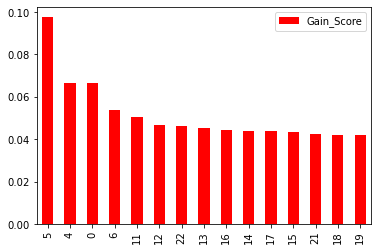

In [29]:
newx.plot(kind='bar',color=['red'])

# Select K best

In [30]:
df = pd.read_csv('credit card.csv - credit card.csv.csv')
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [31]:
from sklearn.feature_selection import f_classif, SelectKBest,chi2,f_regression

In [32]:
model2 = SelectKBest(score_func=f_classif)

In [33]:
feature_score=model2.fit(x,y)

In [34]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [35]:
col1 = pd.DataFrame(feature_score.scores_,columns=['Feature_Scores'])
col1

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [36]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [37]:
col2 = pd.DataFrame(x.columns,columns=['Feature_Names'])

In [38]:
col2.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


In [39]:
scores=pd.concat([col2,col1],axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


# PCA

In [40]:
df = pd.read_csv('credit card.csv - credit card.csv.csv')
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [41]:
from sklearn.preprocessing import MinMaxScaler

In [42]:
mx = MinMaxScaler()

In [43]:
scaled_x=mx.fit_transform(x)

In [44]:
scaled_x.shape

(30000, 23)

In [45]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [46]:
from sklearn.decomposition import PCA

In [47]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [48]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259673],
       [-0.39188881,  0.209224  , -0.19698761],
       [-0.39264215,  0.08409527, -0.12656656],
       ...,
       [ 0.62351265,  0.33728837, -0.08489176],
       [ 0.60374479, -0.01953155,  0.21421103],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [49]:
features = pd.DataFrame(x_pca,columns=['pca1','pca2','pca3'])

In [50]:
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [51]:

import plotly.express as pl
pl.scatter_3d(features,x='pca1',y='pca2',z='pca3',color='pca1')

In [52]:
from sklearn.model_selection import train_test_split

In [58]:
xtrain,xtest,ytrain,ytest = train_test_split(features,y,test_size=.30,random_state=101)

In [59]:
xtrain

,pca1,pca2,pca3
12160,-0.395971,0.076134,0.111912
1100,-0.384860,0.087107,0.047800
22225,-0.394268,0.100412,-0.210155
6385,-0.392977,0.025772,-0.124440
22930,-0.400194,-0.019527,0.100697
...,...,...,...
5695,0.603426,0.049143,-0.245381
8006,-0.395567,0.110827,-0.191299
17745,-0.394395,-0.203851,0.325182
17931,0.617625,0.307307,-0.069465


In [60]:
from sklearn.tree import DecisionTreeClassifier

In [67]:
clf = DecisionTreeClassifier()

In [68]:
clf.fit(xtrain,ytrain)

DecisionTreeClassifier()

In [69]:
clf.score(xtest,ytest)

0.7127777777777777

In [70]:
clf.score(xtrain,ytrain)

0.9996190476190476

# Before

In [71]:
xtrain1,xtest1,ytrain1,ytest1 = train_test_split(x,y,test_size=.30,random_state=101)

In [72]:
clf.fit(xtrain1,ytrain1)

DecisionTreeClassifier()

In [74]:
clf.score(xtest1,ytest1)

0.7232222222222222

In [75]:
clf.score(xtrain1,ytrain1)

0.9996190476190476